# Calibrated Explanations
## Comparison with LIME

Author: Tuwe Löfström (tuwe.lofstrom@ju.se)  
Copyright 2023 Tuwe Löfström  
License: BSD 3 clause
Sources:
1. [Wine Quality [uci]](https://archive.ics.uci.edu/ml/datasets/wine+quality)
2. [California Housing data set [kaggle]](https://www.kaggle.com/datasets/camnugent/california-housing-prices)

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings

from lime.lime_tabular import LimeTabularExplainer
from sklearn.datasets import fetch_openml
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split

warnings.filterwarnings("ignore", category=UserWarning)


from calibrated_explanations import WrapCalibratedExplainer, __version__

print(f"calibrated_explanations {__version__}")

calibrated_explanations v0.11.1


# Classification

In [3]:
dataset = fetch_openml(name="wine", version=7, as_frame=True)

X = dataset.data.values.astype(float)
y = (dataset.target.values == "True").astype(int)

feature_names = dataset.feature_names

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=2, stratify=y)

X_prop_train, x_cal, y_prop_train, y_cal = train_test_split(x_train, y_train, test_size=0.25)

In [4]:
rf = RandomForestClassifier(n_jobs=-1)

rf.fit(X_prop_train, y_prop_train)

,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",100
,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.Note: This parameter is tree-specific.",'gini'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",None
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=""sqrt""The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to `""sqrt""`.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",'sqrt'
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow trees with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at the current node, ``N_t_L`` is the number of samples in theleft child, and ``N_t_R`` is the number of samples in the right child.``N``, ``N_t``, ``N_t_R`` and ``N_t_L`` all refer to the weighted sum,if ``sample_weight`` is passed... versionadded:: 0.19",0.0
,"bootstrap bootstrap: bool, default=TrueWhether bootstrap samples are used when building trees. If False, thewhole dataset is used to build each tree.",True
,"oob_score oob_score: bool or callable, default=FalseWhether to use out-of-bag samples to estimate the generalization score.By default, :func:`~sklearn.metrics.accuracy_score` is used.Provide a callable with signature `metric

In [5]:
cal_expl = WrapCalibratedExplainer(rf)
cal_expl.calibrate(x_cal, y_cal, feature_names=feature_names, mode="classification")
display(cal_expl)

C:\Users\loftuw\AppData\Local\Python\pythoncore-3.14-64\Lib\importlib\__init__.py:88: UserWarning: Cache backend fallback: using minimal in-package LRU/TTL implementation due to missing 'cachetools'
  return _bootstrap._gcd_import(name[level:], package, level)


WrapCalibratedExplainer(learner=RandomForestClassifier(n_jobs=-1), fitted=True, calibrated=True, 
		explainer=CalibratedExplainer(mode=classification, learner=RandomForestClassifier(n_jobs=-1)))

In [6]:
factual_explanations_cl = cal_expl.explain_factual(x_test)
ce_as_lime_cl = factual_explanations_cl.as_lime()

C:\Users\loftuw\AppData\Local\Temp\ipykernel_37772\1370274681.py:2: DeprecationWarning: CalibratedExplanations.as_lime is deprecated since v0.11.1; use external_plugins.integrations.lime_pipeline.LimePipeline(...).explain(...) instead. This API is scheduled for removal by v0.11.3 under the pre-v1.0 zero-deprecation closure policy.
  ce_as_lime_cl = factual_explanations_cl.as_lime()


In [7]:
lime_expl = LimeTabularExplainer(x_cal, feature_names=feature_names)
lime_exps_cl = []
for instance in x_test:
    exp = lime_expl.explain_instance(instance, rf.predict_proba)
    lime_exps_cl.append(exp)

Instance 0: LIME Explanation


Instance 0: Calibrated Explanation


c:\Users\loftuw\Documents\Github\moffran-calibrated_explanations\calibrated_explanations\venv-wheel\Lib\site-packages\calibrated_explanations\legacy\plotting.py:242: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
c:\Users\loftuw\Documents\Github\moffran-calibrated_explanations\calibrated_explanations\venv-wheel\Lib\site-packages\calibrated_explanations\legacy\plotting.py:242: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Instance 1: LIME Explanation


c:\Users\loftuw\Documents\Github\moffran-calibrated_explanations\calibrated_explanations\venv-wheel\Lib\site-packages\calibrated_explanations\legacy\plotting.py:242: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Instance 1: Calibrated Explanation


c:\Users\loftuw\Documents\Github\moffran-calibrated_explanations\calibrated_explanations\venv-wheel\Lib\site-packages\calibrated_explanations\legacy\plotting.py:242: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


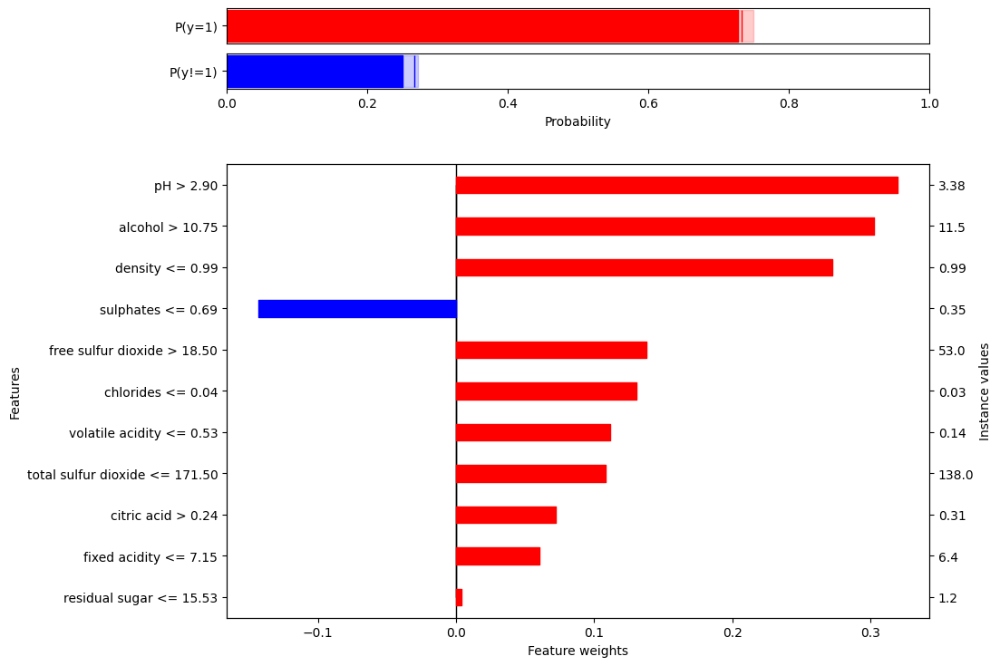

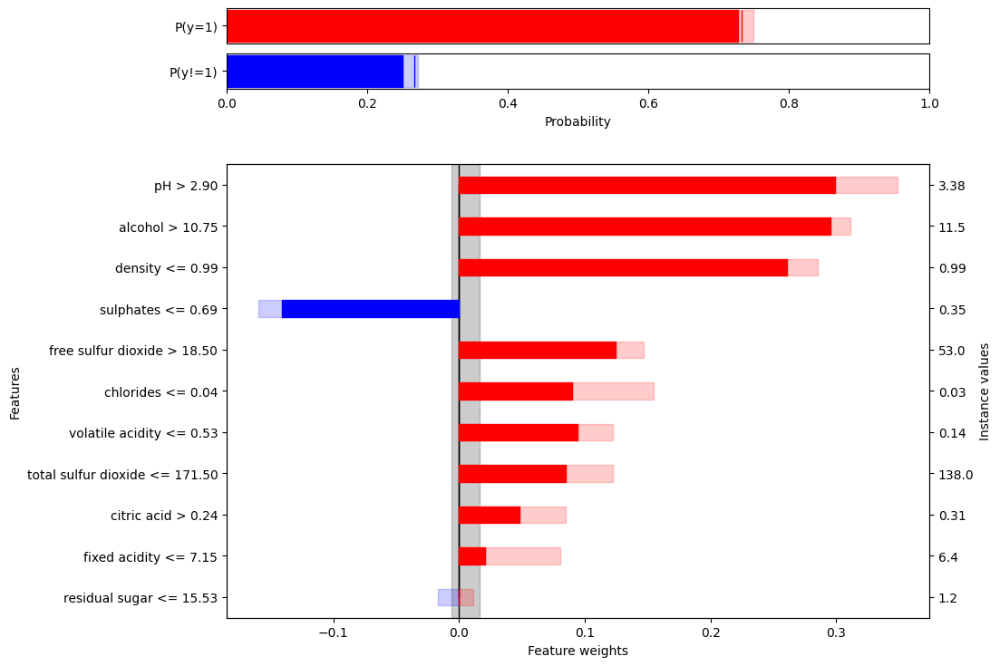

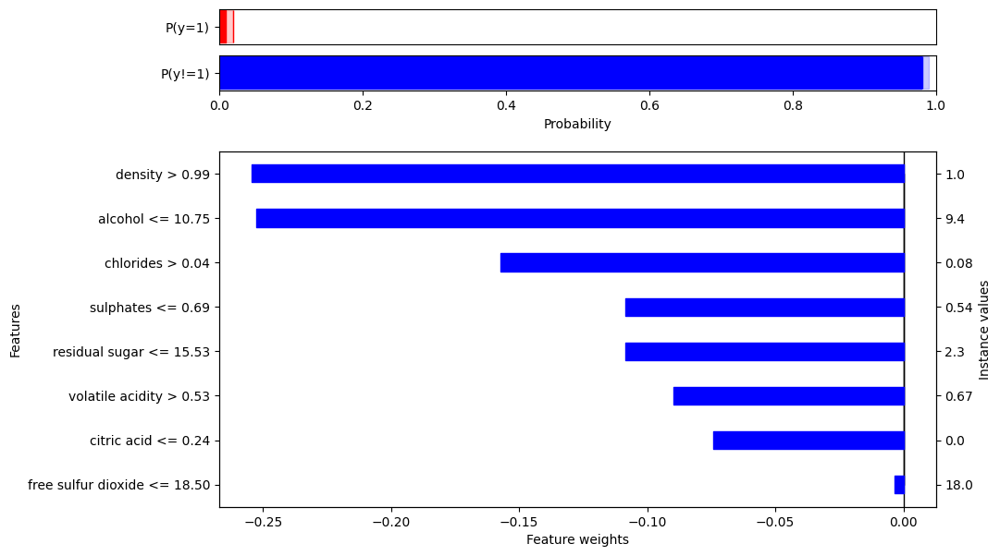

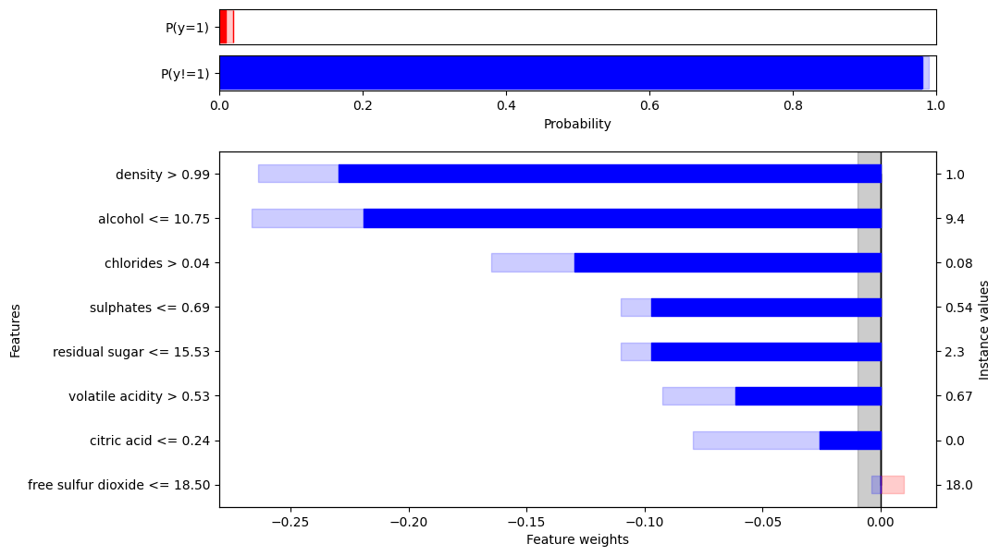

In [8]:
for i, (ce, lime) in enumerate(zip(ce_as_lime_cl, lime_exps_cl, strict=False)):
    print(f"Instance {i}: LIME Explanation")
    lime.show_in_notebook(show_table=True)
    print(f"Instance {i}: Calibrated Explanation")
    factual_explanations_cl[i].plot()
    factual_explanations_cl[i].plot(uncertainty=True)
    ce.show_in_notebook(show_table=True)

# Regression

In [9]:
dataset = fetch_openml(name="house_sales", version=3)

X = dataset.data.values.astype(float)
y = dataset.target.values
filter_idx = y <= 500000
X = X[filter_idx, :]
y = y[filter_idx]
y = y / 1000

feature_names = dataset.feature_names

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=2, random_state=42)

X_prop_train, x_cal, y_prop_train, y_cal = train_test_split(x_train, y_train, test_size=0.25)

Let us split the data set into a training and a test set, and further split the training set into a proper training set and a calibration set. Let us fit a random forest to the proper training set. We also set a random seed to be able to rerun the notebook and get the same results.

In [10]:
rf = RandomForestRegressor(n_estimators=100, oob_score=True)

rf.fit(X_prop_train, y_prop_train)

,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",100
,"criterion criterion: {""squared_error"", ""absolute_error"", ""friedman_mse"", ""poisson""}, default=""squared_error""The function to measure the quality of a split. Supported criteriaare ""squared_error"" for the mean squared error, which is equal tovariance reduction as feature selection criterion and minimizes the L2loss using the mean of each terminal node, ""friedman_mse"", which usesmean squared error with Friedman's improvement score for potentialsplits, ""absolute_error"" for the mean absolute error, which minimizesthe L1 loss using the median of each terminal node, and ""poisson"" whichuses reduction in Poisson deviance to find splits.Training using ""absolute_error"" is significantly slowerthan when using ""squared_error""... versionadded:: 0.18 Mean Absolute Error (MAE) criterion... versionadded:: 1.0 Poisson criterion.",'squared_error'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",None
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=1.0The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None or 1.0, then `max_features=n_features`... note:: The default of 1.0 is equivalent to bagged trees and more randomness can be achieved by setting smaller values, e.g. 0.3... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to 1.0.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",1.0
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow trees with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsample

In [11]:
cal_expl = WrapCalibratedExplainer(rf)
cal_expl.calibrate(x_cal, y_cal, feature_names=feature_names, mode="regression")
display(cal_expl)

WrapCalibratedExplainer(learner=RandomForestRegressor(oob_score=True), fitted=True, calibrated=True, 
		explainer=CalibratedExplainer(mode=regression, learner=RandomForestRegressor(oob_score=True), difficulty_estimator=None))

In [12]:
factual_explanations_reg = cal_expl.explain_factual(x_test, low_high_percentiles=(5, 95))
ce_as_lime_reg = factual_explanations_reg.as_lime(num_features_to_show=10)

In [13]:
lime_expl = LimeTabularExplainer(x_cal, feature_names=feature_names, mode="regression")
lime_exps_reg = []
for instance in x_test:
    exp = lime_expl.explain_instance(instance, rf.predict)
    lime_exps_reg.append(exp)

Instance 0: LIME Explanation


Instance 0: Calibrated Explanation


c:\Users\loftuw\Documents\Github\moffran-calibrated_explanations\calibrated_explanations\venv-wheel\Lib\site-packages\calibrated_explanations\legacy\plotting.py:367: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
c:\Users\loftuw\Documents\Github\moffran-calibrated_explanations\calibrated_explanations\venv-wheel\Lib\site-packages\calibrated_explanations\legacy\plotting.py:367: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Instance 1: LIME Explanation


Instance 1: Calibrated Explanation


c:\Users\loftuw\Documents\Github\moffran-calibrated_explanations\calibrated_explanations\venv-wheel\Lib\site-packages\calibrated_explanations\legacy\plotting.py:367: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
c:\Users\loftuw\Documents\Github\moffran-calibrated_explanations\calibrated_explanations\venv-wheel\Lib\site-packages\calibrated_explanations\legacy\plotting.py:367: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


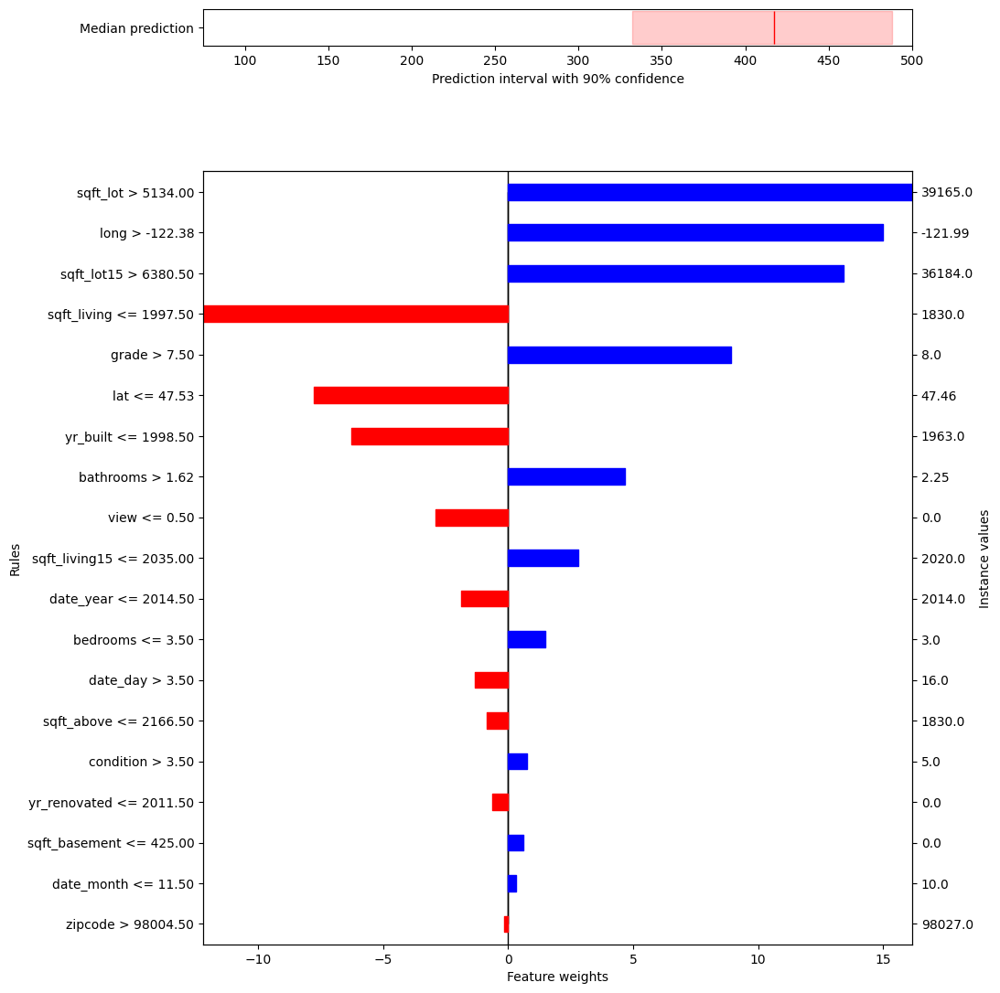

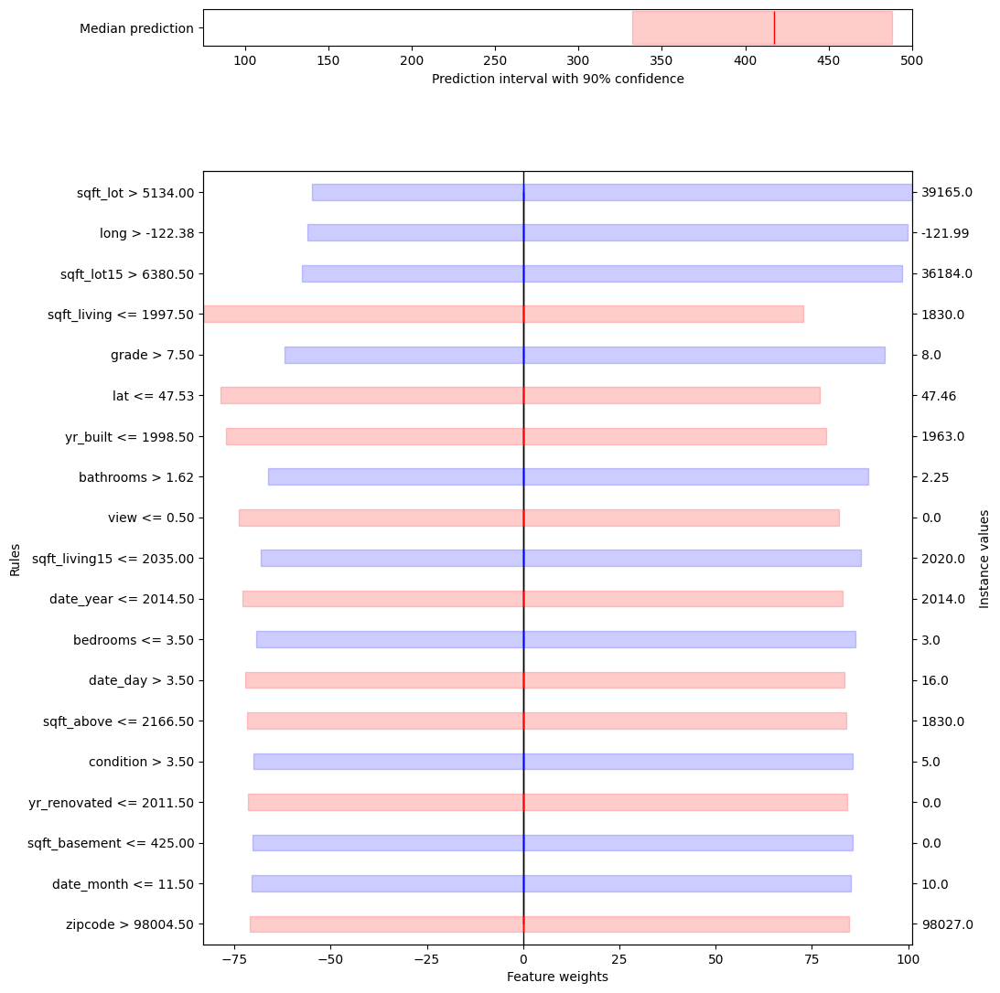

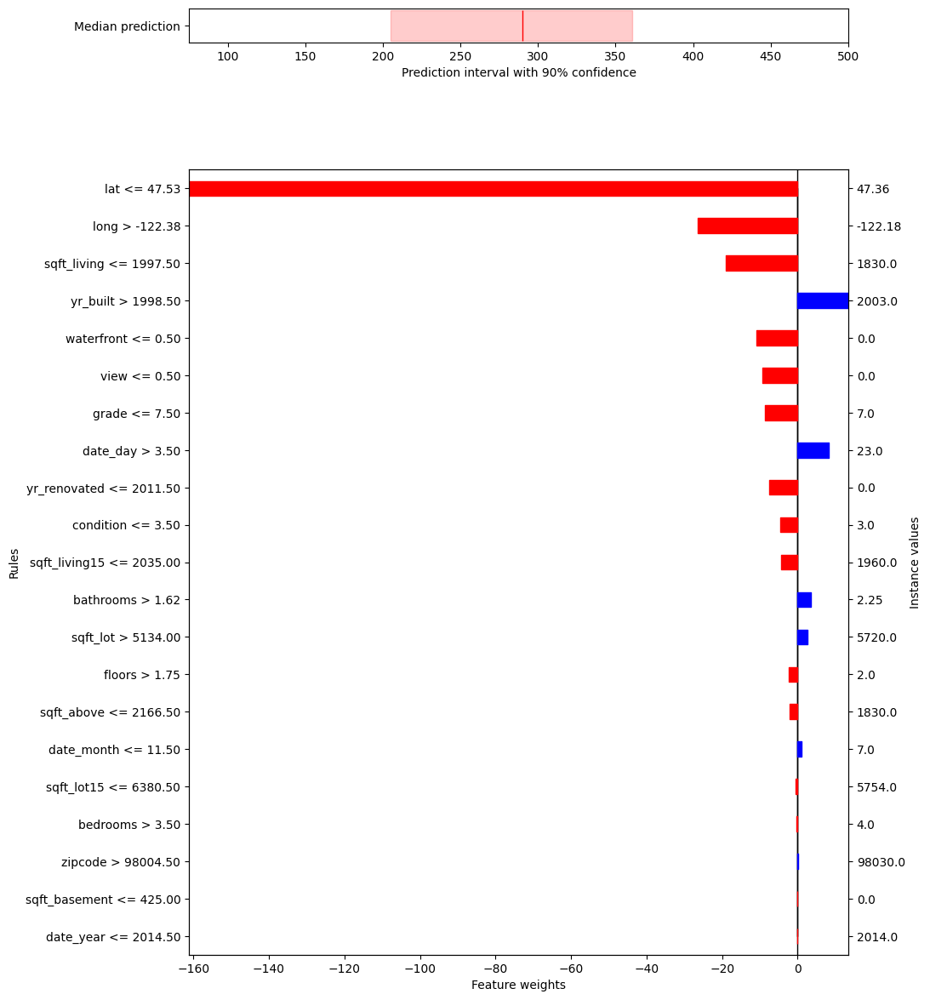

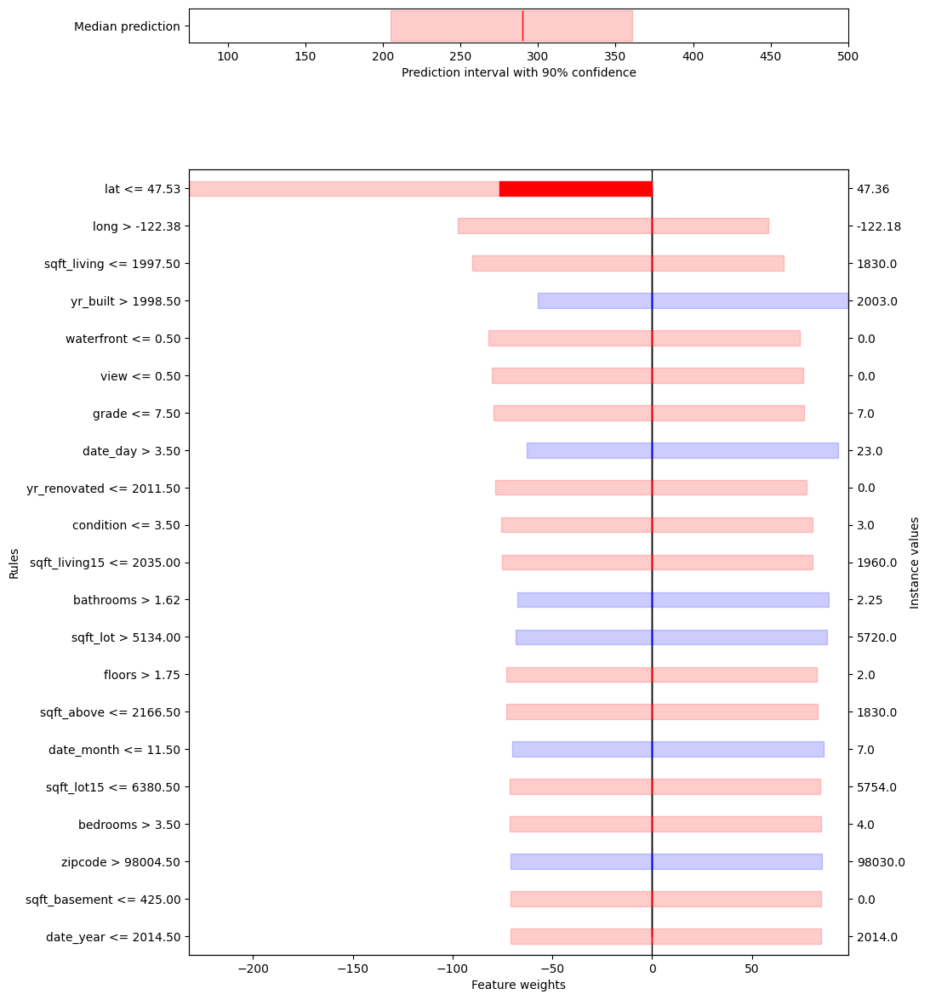

In [14]:
for i, (ce, lime) in enumerate(zip(ce_as_lime_reg, lime_exps_reg, strict=False)):
    print(f"Instance {i}: LIME Explanation")
    lime.show_in_notebook(show_table=True)
    print(f"Instance {i}: Calibrated Explanation")
    factual_explanations_reg[i].plot()
    factual_explanations_reg[i].plot(uncertainty=True)
    ce.show_in_notebook(show_table=True)